## 🌱 Automated Plant Disease Detection using Convolutional Neural Networks and Transfer Learning (MobileNetV2 & VGG16) 🌱

# Part 1 - Business Problem

### **Business Context**

Crop health monitoring plays a crucial role in modern agriculture. Early detection and accurate classification of plant diseases can prevent large-scale crop failures, reduce financial losses, and ensure food security.

Manual inspection by human experts is time-consuming, subjective, and impractical for large farming areas. Therefore, developing an automated, scalable, and reliable plant disease detection system using computer vision and deep learning is essential.

### **Business Problem**

The goal of this project is to build an automated image classification system capable of identifying **three major plant leaf conditions**:

* Healthy
* Powdery (Powdery Mildew Disease)
* Rust (Rust Disease)

The system will analyze images of plant leaves and classify them into one of these categories, assisting farmers and agricultural specialists in making timely and informed decisions regarding plant treatment.

### **Technical Approach**

We will implement and compare two approaches for feature extraction and classification:

1. **Custom CNN Baseline**
   A simple Convolutional Neural Network (CNN) designed from scratch for image classification.

2. **Transfer Learning with Pre-trained Models**
   We will use the following models, pre-trained on ImageNet and fine-tuned for this task:

   * MobileNetV2
   * VGG16

Both models will be fine-tuned for the specific task of plant disease recognition.

### **Dataset Description**

* Total Images: **1,530**
* Classes: **Healthy, Powdery, Rust**
* Data Split:

  * Training Set
  * Validation Set
  * Test Set
* Image Format: **RGB leaf images**, organized in folders by class.

### **Evaluation Metrics**

* Accuracy
* Precision, Recall, F1-score
* Confusion Matrix
* Training and validation loss/accuracy curves
* Visual inspection of model predictions (True vs Predicted)

### **Expected Business Value**

* Reduction of manual labor and diagnostic time
* Increased accuracy in disease identification
* Early treatment recommendations for farmers
* Potential integration into mobile applications for use in the field

### **Optional Future Extensions**

* Multi-class classification for additional plant diseases
* Deployment as a web or mobile application
* Integration with drone-based imaging systems for large-scale agricultural monitoring

In [1]:
import os

# Libraries for data manipulation and analysis
import numpy as np
import pandas as pd

# Libraries for data visualization
import matplotlib.pyplot as plt
import seaborn as sns

# TensorFlow and Keras libraries for building deep learning models
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Additional Keras layers and callbacks for regularization and training control
from tensorflow.keras.layers import BatchNormalization
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.layers import GlobalAveragePooling2D
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam

# Pre-trained CNN architectures for Transfer Learning
from tensorflow.keras.applications import MobileNetV2, VGG16

# Scikit-learn metrics for evaluation
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize

# Computer vision utilities and image preprocessing
import cv2
from tensorflow.keras.preprocessing import image

2025-07-08 04:47:14.588741: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1751950034.817635      19 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1751950034.885210      19 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


# Part 2 - Database

In [2]:
# Directory Paths 
train_dir = "/kaggle/input/plant-disease-recognition-dataset/Train/Train"
val_dir = "/kaggle/input/plant-disease-recognition-dataset/Validation/Validation"
test_dir = "/kaggle/input/plant-disease-recognition-dataset/Test/Test"

# Part 3 - Pre-processing

In [3]:
# Data augmentation applied to the training set
train_datagen = ImageDataGenerator(rescale=1./255,
                                   rotation_range=30,
                                   zoom_range=0.2,
                                   horizontal_flip=True)

# Only normalization applied to validation and test sets
val_test_datagen = ImageDataGenerator(rescale=1./255)

In [4]:
# Creating the data generators

# Training data generator
train_generator = train_datagen.flow_from_directory(train_dir,
                                                    target_size=(128, 128),
                                                    batch_size=32,
                                                    class_mode='categorical')

# Validation data generator
val_generator = val_test_datagen.flow_from_directory(val_dir,
                                                     target_size=(128, 128),
                                                     batch_size=32,
                                                     class_mode='categorical')

# Test data generator (no shuffling to preserve label order)
test_generator = val_test_datagen.flow_from_directory(test_dir,
                                                      target_size=(128, 128),
                                                      batch_size=32,
                                                      class_mode='categorical',
                                                      shuffle=False)

Found 1322 images belonging to 3 classes.
Found 60 images belonging to 3 classes.
Found 150 images belonging to 3 classes.


# Part 4 - Data visualization

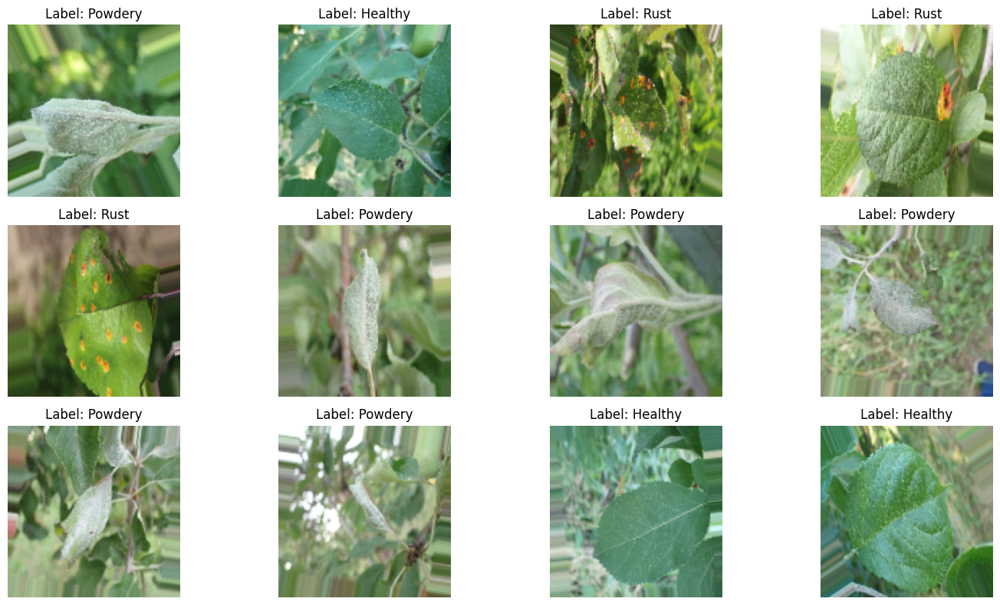

In [5]:
# Get a batch of images and labels
images, labels = next(train_generator)

# Class names
class_names = list(train_generator.class_indices.keys())

# Number of images to display
num_images = 12  # For example, display 12 images

plt.figure(figsize=(15, 8))

for i in range(num_images):
    plt.subplot(3, 4, i + 1)  # Grid of 3 rows x 4 columns
    plt.imshow(images[i])
    label_index = np.argmax(labels[i])
    plt.title(f"Label: {class_names[label_index]}")
    plt.axis('off')

plt.tight_layout()
plt.show()

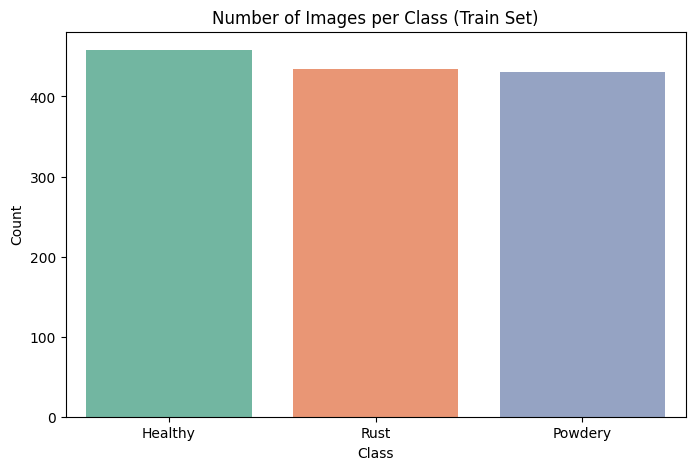

In [6]:
# List the number of images per class
labels = []
for class_name in os.listdir(train_dir):
    class_path = os.path.join(train_dir, class_name)
    if os.path.isdir(class_path):
        num_images = len(os.listdir(class_path))
        labels.extend([class_name] * num_images)

# Create a DataFrame
df = pd.DataFrame({'Class': labels})

# Plot using Seaborn
plt.figure(figsize=(8, 5))
sns.countplot(x='Class', data=df, palette='Set2')
plt.title('Number of Images per Class (Train Set)')
plt.xlabel('Class')
plt.ylabel('Count')
plt.grid(False)
plt.show()

# Part 5 - Data Augmentation

In [7]:
# Directory paths for training, validation, and test datasets
train_dir = "/kaggle/input/plant-disease-recognition-dataset/Train/Train"
val_dir = "/kaggle/input/plant-disease-recognition-dataset/Validation/Validation"
test_dir = "/kaggle/input/plant-disease-recognition-dataset/Test/Test"

# Image preprocessing parameters
target_size = (224, 224)  # Resize all images to 224x224 pixels
batch_size = 32           # Number of images per batch

In [8]:
# ImageDataGenerator for training set with data augmentation and normalization
train_datagen = ImageDataGenerator(rescale=1./255,
                                   rotation_range=30,
                                   width_shift_range=0.2,
                                   height_shift_range=0.2,
                                   shear_range=0.2,
                                   zoom_range=0.2,
                                   horizontal_flip=True,
                                   brightness_range=[0.8, 1.2])

# ImageDataGenerator for validation and test sets (only normalization)
val_test_datagen = ImageDataGenerator(rescale=1./255)

# Load training images from directory with real-time data augmentation
train_generator = train_datagen.flow_from_directory(train_dir, 
                                                    target_size=target_size, 
                                                    batch_size=batch_size, 
                                                    class_mode='categorical')

# Load validation images from directory (no augmentation)
val_generator = val_test_datagen.flow_from_directory(val_dir,   
                                                     target_size=target_size, 
                                                     batch_size=batch_size, 
                                                     class_mode='categorical')

# Load test images from directory (no augmentation, no shuffling for accurate evaluation)
test_generator = val_test_datagen.flow_from_directory(test_dir,  
                                                      target_size=target_size, 
                                                      batch_size=batch_size, 
                                                      class_mode='categorical', 
                                                      shuffle=False)


Found 1322 images belonging to 3 classes.
Found 60 images belonging to 3 classes.
Found 150 images belonging to 3 classes.


In [9]:
# Get the class names from the training generator (e.g., ['Healthy', 'Powdery', 'Rust'])
class_names = list(train_generator.class_indices.keys())

# Part 6 - Convolutional Neural Network - MobileNetV2 VGG16 ResNet50 InceptionV3 EfficientNetB0 DenseNet121

In [10]:
%%time 

from tensorflow.keras.applications import ResNet50, InceptionV3, EfficientNetB0, DenseNet121

# Model configuration list: model name, base architecture, and last convolutional layer for fine-tuning or Grad-CAM
model_configs = [

    # CNN MobileNetV2 
    {
        "name": "MobileNetV2",    
        "base": MobileNetV2,    
        "layer": "Conv_1"
    },

    # CNN VGG16 
    {
        "name": "VGG16",
        "base": VGG16,
        "layer": "block5_conv3"
    },

    # CNN ResNet50 
    {
        "name": "ResNet50",
        "base": ResNet50,
        "layer": "conv5_block3_out"
    },

    # CNN InceptionV3 
    {
        "name": "InceptionV3",
        "base": InceptionV3,
        "layer": "mixed10"
    },

    # CNN EfficientNetB0 
    {
        "name": "EfficientNetB0", 
        "base": EfficientNetB0, 
        "layer": "top_activation"
    },

    # CNN DenseNet121 
    {
        "name": "DenseNet121", 
        "base": DenseNet121,   
        "layer": "relu"
    }
]

# Callbacks
early_stop = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=3)

# List to store trained models and their histories
trained_models = []

# Loop through each model configuration
for config in model_configs:
    print(f"\nTraining model: {config['name']}\n")

    # Load the base model without the top classification layers
    base_model = config['base'](weights='imagenet', include_top=False, input_shape=(224, 224, 3))
    base_model.trainable = False  # Freeze the convolutional base

    # Add custom classification head
    x = base_model.output
    x = GlobalAveragePooling2D()(x)      # Global average pooling to reduce feature maps
    x = Dense(512, activation='relu')(x) # Fully connected layer
    x = Dropout(0.5)(x)                  # Dropout for regularization

    # Output layer with 3 classes and softmax activation
    output = Dense(3, activation='softmax')(x)

    # Create the final model
    model = Model(inputs=base_model.input, outputs=output)

    # Compile the model with Adam optimizer and categorical cross-entropy loss
    model.compile(optimizer=Adam(1e-4),
                  loss='categorical_crossentropy',
                  metrics=['accuracy'])

    # Train the model with early stopping and learning rate reduction
    history = model.fit(train_generator,
                        validation_data=val_generator,
                        epochs=100,
                        callbacks=[early_stop, reduce_lr])

    # Save the trained model to file
    model.save(f"{config['name']}_model.keras")

    # Append model, history, and metadata to the list for later evaluation
    trained_models.append({"name": config["name"],
                           "model": model,
                           "history": history,
                           "layer": config["layer"]})


Training model: MobileNetV2



I0000 00:00:1751950054.867723      19 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 13942 MB memory:  -> device: 0, name: Tesla T4, pci bus id: 0000:00:04.0, compute capability: 7.5
I0000 00:00:1751950054.868432      19 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:1 with 13942 MB memory:  -> device: 1, name: Tesla T4, pci bus id: 0000:00:05.0, compute capability: 7.5


9406464/9406464 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/100


I0000 00:00:1751950073.704431     106 service.cc:148] XLA service 0x78a290111980 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1751950073.705591     106 service.cc:156]   StreamExecutor device (0): Tesla T4, Compute Capability 7.5
I0000 00:00:1751950073.705617     106 service.cc:156]   StreamExecutor device (1): Tesla T4, Compute Capability 7.5
I0000 00:00:1751950074.772239     106 cuda_dnn.cc:529] Loaded cuDNN version 90300


 1/42 ━━━━━━━━━━━━━━━━━━━━ 10:49 16s/step - accuracy: 0.3750 - loss: 1.4402

I0000 00:00:1751950079.516720     106 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


42/42 ━━━━━━━━━━━━━━━━━━━━ 126s 3s/step - accuracy: 0.4873 - loss: 1.1490 - val_accuracy: 0.9333 - val_loss: 0.2775 - learning_rate: 1.0000e-04
Epoch 2/100
42/42 ━━━━━━━━━━━━━━━━━━━━ 95s 2s/step - accuracy: 0.8491 - loss: 0.3823 - val_accuracy: 0.9500 - val_loss: 0.1833 - learning_rate: 1.0000e-04
Epoch 3/100
42/42 ━━━━━━━━━━━━━━━━━━━━ 87s 2s/step - accuracy: 0.8939 - loss: 0.2649 - val_accuracy: 0.9500 - val_loss: 0.1530 - learning_rate: 1.0000e-04
Epoch 4/100
42/42 ━━━━━━━━━━━━━━━━━━━━ 89s 2s/step - accuracy: 0.9254 - loss: 0.2374 - val_accuracy: 0.9500 - val_loss: 0.1538 - learning_rate: 1.0000e-04
Epoch 5/100
42/42 ━━━━━━━━━━━━━━━━━━━━ 88s 2s/step - accuracy: 0.9124 - loss: 0.2287 - val_accuracy: 0.9500 - val_loss: 0.1267 - learning_rate: 1.0000e-04
Epoch 6/100
42/42 ━━━━━━━━━━━━━━━━━━━━ 92s 2s/step - accuracy: 0.9488 - loss: 0.1767 - val_accuracy: 0.9500 - val_loss: 0.1136 - learning_rate: 1.0000e-04
Epoch 7/100
42/42 ━━━━━━━━━━━━━━━━━━━━ 87s 2s/step - accuracy: 0.9393 - loss: 0.1


Performance Curves (Accuracy and Loss)



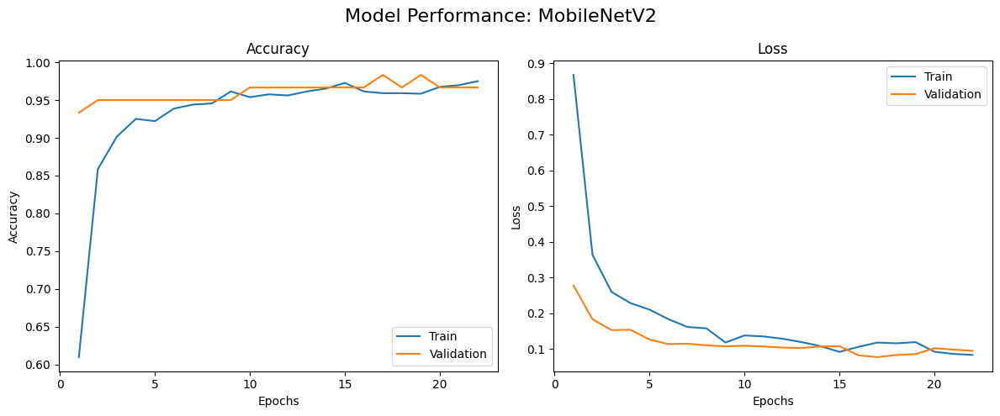

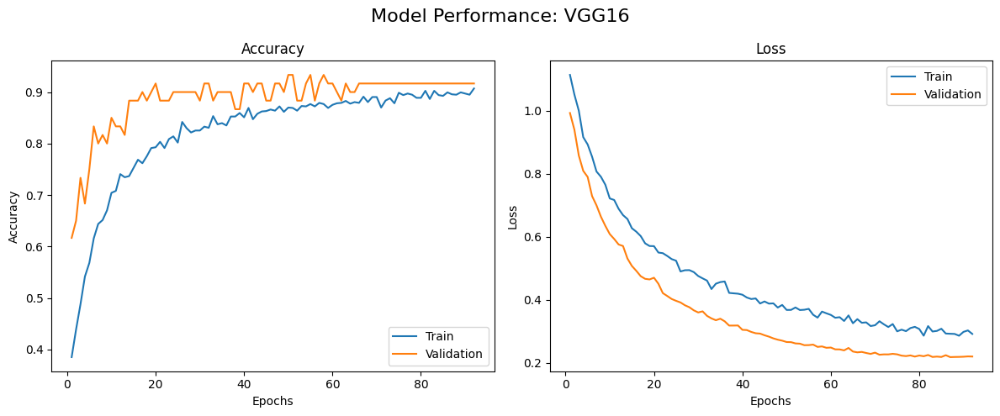

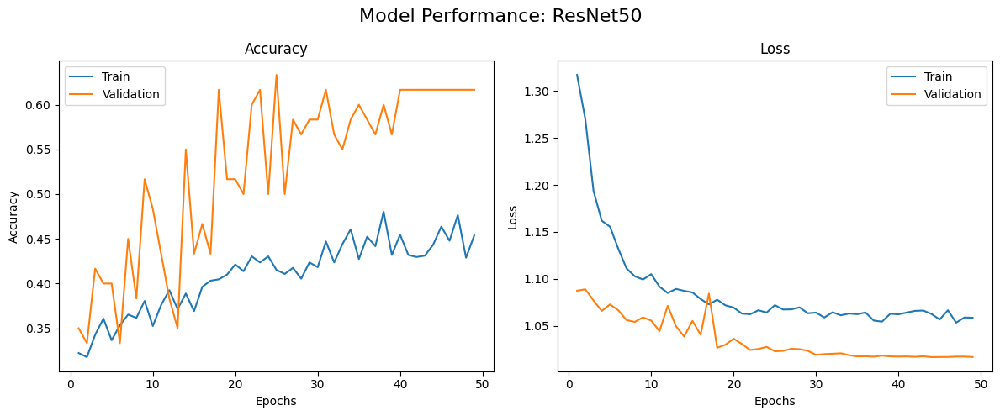

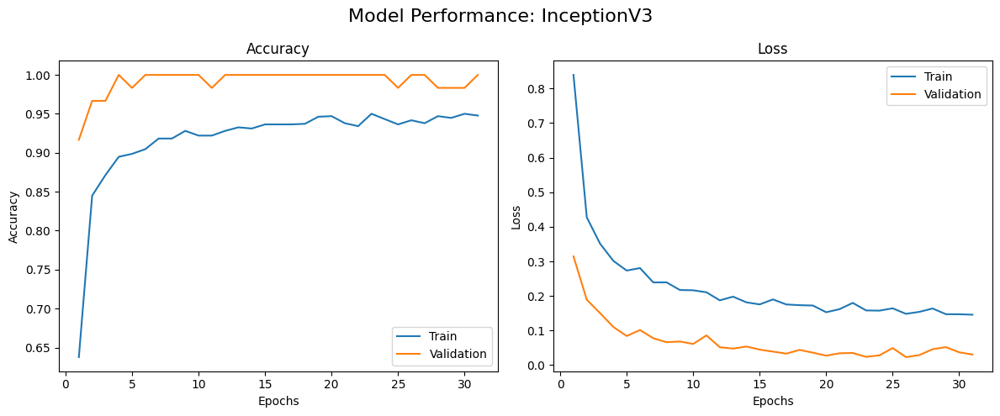

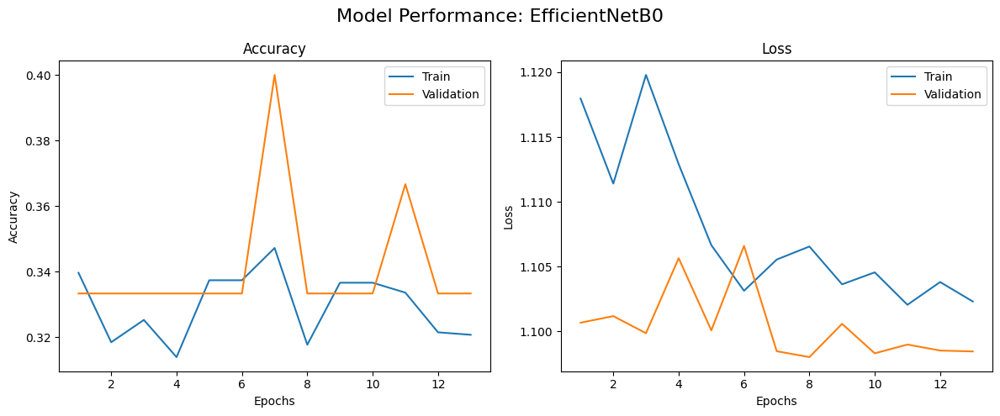

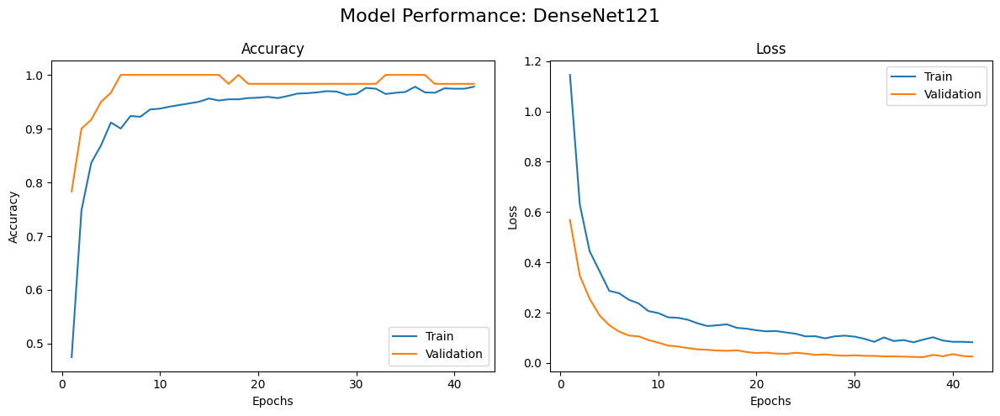

In [11]:
# Plot performance curves (accuracy and loss) for each trained model
print("\nPerformance Curves (Accuracy and Loss)\n")

for result in trained_models:
    model_name = result["name"]
    history = result["history"]

    # Extract training and validation metrics from the history object
    acc = history.history['accuracy']
    val_acc = history.history['val_accuracy']
    loss = history.history['loss']
    val_loss = history.history['val_loss']

    epochs_range = range(1, len(acc) + 1)

    # Create a new figure for each model
    plt.figure(figsize=(12, 5))
    plt.suptitle(f"Model Performance: {model_name}", fontsize=16)

    # Accuracy plot
    plt.subplot(1, 2, 1)
    plt.plot(epochs_range, acc, label='Train')
    plt.plot(epochs_range, val_acc, label='Validation')
    plt.title('Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()
    plt.grid(False)

    # Loss plot
    plt.subplot(1, 2, 2)
    plt.plot(epochs_range, loss, label='Train')
    plt.plot(epochs_range, val_loss, label='Validation')
    plt.title('Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.grid(False)

    plt.tight_layout()
    plt.show()

# Part 7 - CNN Metrics and Evaluations

In [12]:
# Initialize lists to store test images and corresponding labels
X_test, y_test = [], []

# Iterate through the test generator to extract all batches
for i in range(len(test_generator)):
    imgs, labels = test_generator[i]
    X_test.extend(imgs)                                # Append images
    y_test.extend(np.argmax(labels, axis=1))           # Convert one-hot labels to class indices

# Convert lists to NumPy arrays for evaluation
X_test = np.array(X_test)
y_test = np.array(y_test)

In [13]:
# Loop through each trained model to evaluate on the test set
for result in trained_models:
    model = result["model"]
    model_name = result["name"]

    # Predict class probabilities and convert to class labels
    y_pred_prob = model.predict(X_test)
    y_pred = np.argmax(y_pred_prob, axis=1)

    # Print the classification report with precision, recall, F1-score
    print(f"\n=== Classification Report - {model_name} ===")
    print(classification_report(y_test, y_pred, target_names=class_names))

5/5 ━━━━━━━━━━━━━━━━━━━━ 8s 1s/step

=== Classification Report - MobileNetV2 ===
              precision    recall  f1-score   support

     Healthy       0.91      1.00      0.95        50
     Powdery       1.00      0.92      0.96        50
        Rust       1.00      0.98      0.99        50

    accuracy                           0.97       150
   macro avg       0.97      0.97      0.97       150
weighted avg       0.97      0.97      0.97       150

5/5 ━━━━━━━━━━━━━━━━━━━━ 14s 3s/step

=== Classification Report - VGG16 ===
              precision    recall  f1-score   support

     Healthy       0.85      0.88      0.86        50
     Powdery       0.92      0.88      0.90        50
        Rust       0.86      0.86      0.86        50

    accuracy                           0.87       150
   macro avg       0.87      0.87      0.87       150
weighted avg       0.87      0.87      0.87       150

5/5 ━━━━━━━━━━━━━━━━━━━━ 11s 2s/step

=== Classification Report - ResNet50 ===
  

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


5/5 ━━━━━━━━━━━━━━━━━━━━ 27s 4s/step

=== Classification Report - DenseNet121 ===
              precision    recall  f1-score   support

     Healthy       0.94      0.96      0.95        50
     Powdery       0.98      0.94      0.96        50
        Rust       0.96      0.98      0.97        50

    accuracy                           0.96       150
   macro avg       0.96      0.96      0.96       150
weighted avg       0.96      0.96      0.96       150



5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 204ms/step
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step


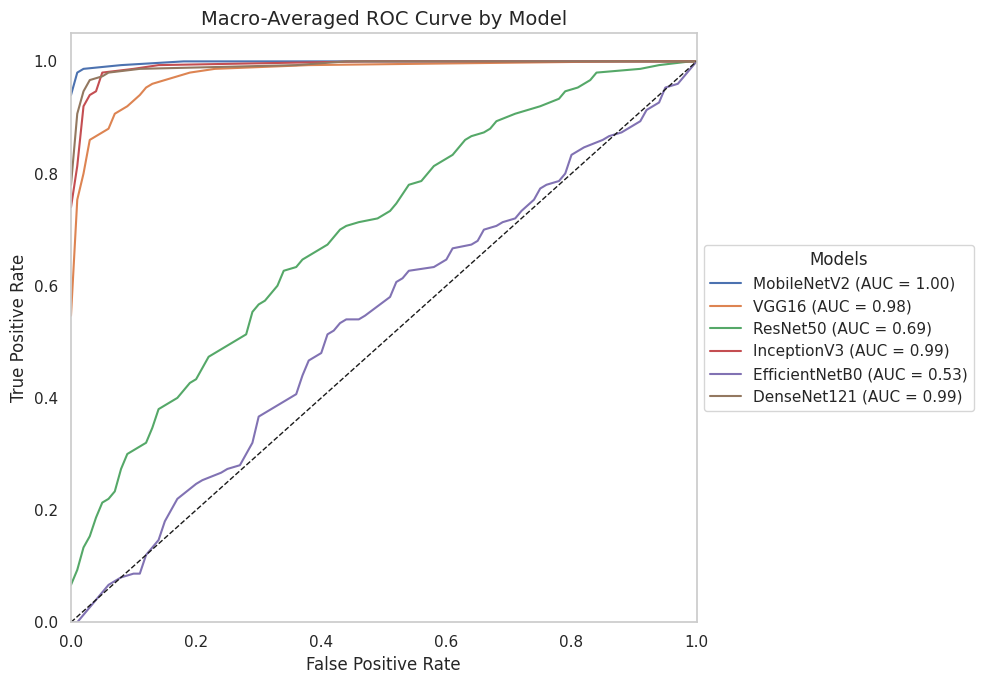

In [14]:
from sklearn.preprocessing import label_binarize

# Set Seaborn style
sns.set(style="whitegrid")

# Binarize true labels for ROC
y_test_bin = label_binarize(y_test, classes=[0, 1, 2])
n_classes = y_test_bin.shape[1]

# Create plot
fig, ax = plt.subplots(figsize=(10, 7))

# Loop over models
for result in trained_models:
    model = result["model"]
    name = result["name"]

    # Predict probabilities on test set
    y_pred_prob = model.predict(X_test)

    # Compute ROC curve and AUC for each class
    fpr = dict()
    tpr = dict()
    roc_auc = dict()
    for i in range(n_classes):
        fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_pred_prob[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])

    # Compute macro-average ROC
    all_fpr = np.unique(np.concatenate([fpr[i] for i in range(n_classes)]))
    mean_tpr = np.zeros_like(all_fpr)
    for i in range(n_classes):
        mean_tpr += np.interp(all_fpr, fpr[i], tpr[i])
    mean_tpr /= n_classes
    roc_auc["macro"] = auc(all_fpr, mean_tpr)

    # Plot macro-average ROC
    ax.plot(all_fpr, mean_tpr, label=f"{name} (AUC = {roc_auc['macro']:.2f})")

# Reference line (random classifier)
ax.plot([0, 1], [0, 1], 'k--', lw=1)

# Formatting
ax.set_xlim([0.0, 1.0])
ax.set_ylim([0.0, 1.05])
ax.set_xlabel('False Positive Rate', fontsize=12)
ax.set_ylabel('True Positive Rate', fontsize=12)
ax.set_title('Macro-Averaged ROC Curve by Model', fontsize=14)
ax.legend(loc='center left', bbox_to_anchor=(1, 0.5), title="Models")
plt.tight_layout()
plt.grid(False)
plt.show()

5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


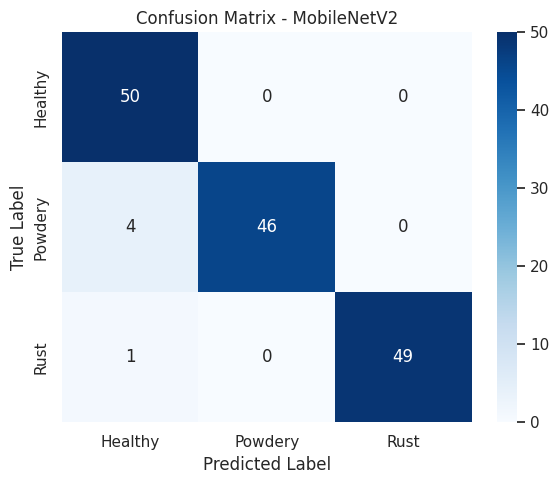

5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 209ms/step


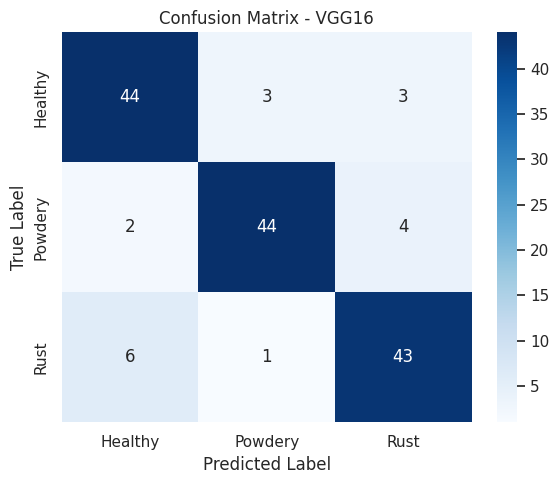

5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step


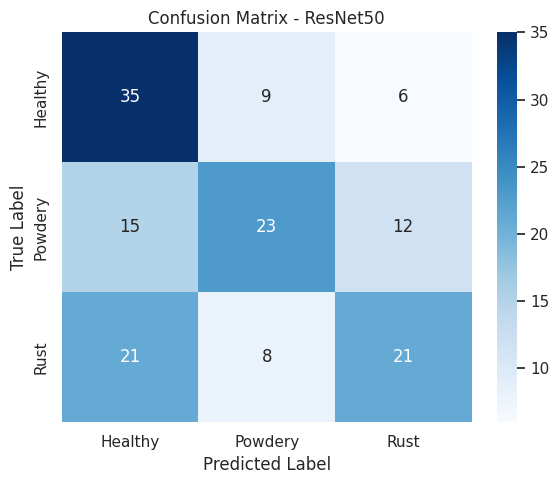

5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step


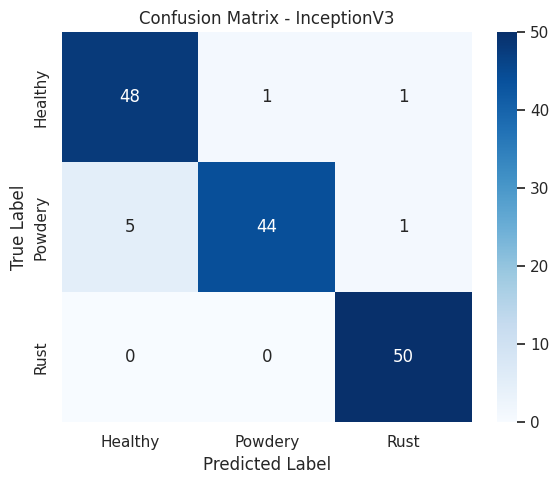

5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


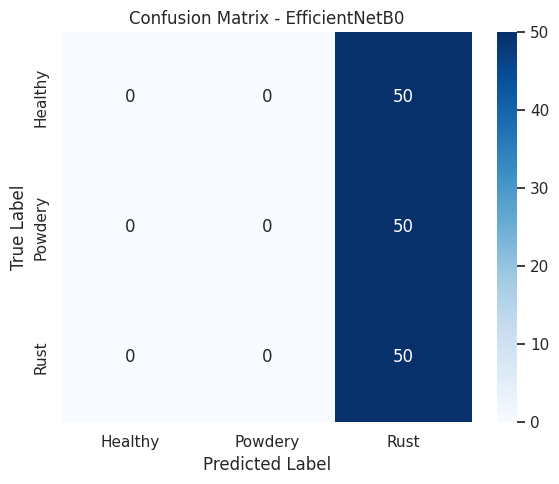

5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step


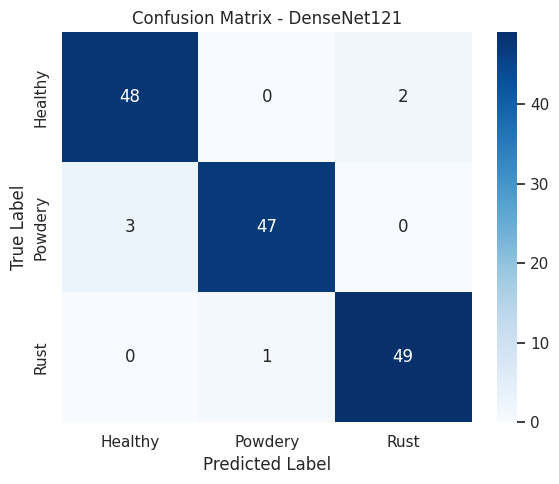

In [15]:
# CONFUSION MATRIX + GRAD-CAM VISUALIZATION

# Function to compute Grad-CAM heatmap for a given class index
def get_gradcam_heatmap(model, img_array, class_index, layer_name):
    # Create a model that outputs the activations of the target layer and the predictions
    grad_model = Model([model.inputs], [model.get_layer(layer_name).output, model.output])

    # Record operations for automatic differentiation
    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        loss = predictions[:, class_index]  # Focus on the specific class

    # Compute gradients of the target class score with respect to the feature map
    grads = tape.gradient(loss, conv_outputs)[0]
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))  # Global average pooling

    conv_outputs = conv_outputs[0]  # Remove batch dimension

    # Compute the weighted sum of the feature maps
    heatmap = tf.reduce_sum(tf.multiply(pooled_grads, conv_outputs), axis=-1)
    heatmap = np.maximum(heatmap, 0)  # Apply ReLU
    heatmap /= tf.math.reduce_max(heatmap)  # Normalize to [0, 1]
    return heatmap.numpy()

# Function to overlay the Grad-CAM heatmap on top of the original image
def overlay_gradcam(img, heatmap, alpha=0.4):
    heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))  # Resize heatmap to match image
    heatmap_color = cv2.applyColorMap(np.uint8(255 * heatmap), cv2.COLORMAP_JET)  # Apply colormap
    superimposed_img = heatmap_color * alpha + img * 255  # Overlay heatmap on original image
    return np.uint8(superimposed_img)

# Loop through all trained models
for result in trained_models:
    model = result["model"]
    model_name = result["name"]
    layer_name = result["layer"]

    # Predict probabilities on test set
    y_pred_prob = model.predict(X_test)
    y_pred = np.argmax(y_pred_prob, axis=1)

    # Plot confusion matrix
    cm = confusion_matrix(y_test, y_pred)
    plt.figure(figsize=(6, 5))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=class_names, yticklabels=class_names)
    plt.title(f'Confusion Matrix - {model_name}')
    plt.xlabel('Predicted Label')
    plt.ylabel('True Label')
    plt.tight_layout()
    plt.show()

/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: [['keras_tensor_917']]
Received: inputs=Tensor(shape=(1, 224, 224, 3))
  warnings.warn(msg)
/tmp/ipykernel_19/908820830.py:28: RuntimeWarning: invalid value encountered in cast
  heatmap_color = cv2.applyColorMap(np.uint8(255 * heatmap), cv2.COLORMAP_JET)  # Apply colormap


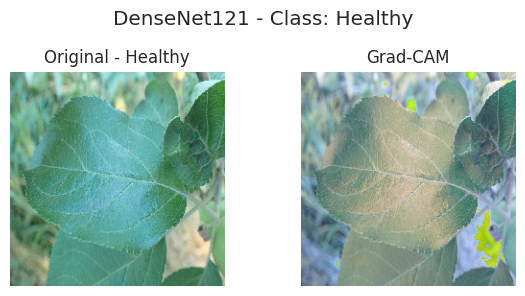

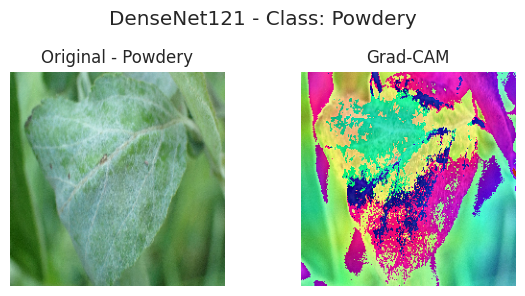

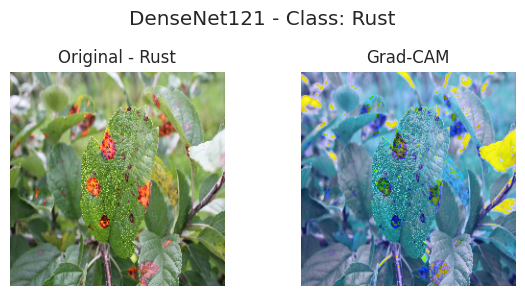

In [16]:
# Display Grad-CAM for one image per class
for class_index in range(len(class_names)):
    idx = np.where(y_test == class_index)[0][0]  # Get first image of the class
    img = X_test[idx]
    img_input = np.expand_dims(img, axis=0)

    heatmap = get_gradcam_heatmap(model, img_input, class_index, layer_name)
    gradcam_img = overlay_gradcam(img, heatmap)

    plt.figure(figsize=(6, 3))
    plt.subplot(1, 2, 1)
    plt.imshow(img)
    plt.title(f"Original - {class_names[class_index]}")
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(gradcam_img[..., ::-1])  # Convert BGR to RGB
    plt.title("Grad-CAM")
    plt.axis('off')

    plt.suptitle(f"{model_name} - Class: {class_names[class_index]}")
    plt.tight_layout()
    plt.show()

# Part 8 - CNN model image predictions

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: [['keras_tensor']]
Received: inputs=Tensor(shape=(1, 224, 224, 3))
  warnings.warn(msg)


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: [['keras_tensor_158']]
Received: inputs=Tensor(shape=(1, 224, 224, 3))
  warnings.warn(msg)


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: [['keras_tensor_181']]
Received: inputs=Tensor(shape=(1, 224, 224, 3))
  warnings.warn(msg)


1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step


/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: [['keras_tensor_360']]
Received: inputs=Tensor(shape=(1, 224, 224, 3))
  warnings.warn(msg)


1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step


/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: [['keras_tensor_675']]
Received: inputs=Tensor(shape=(1, 224, 224, 3))
  warnings.warn(msg)


1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


/tmp/ipykernel_19/2524573934.py:79: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from current font.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


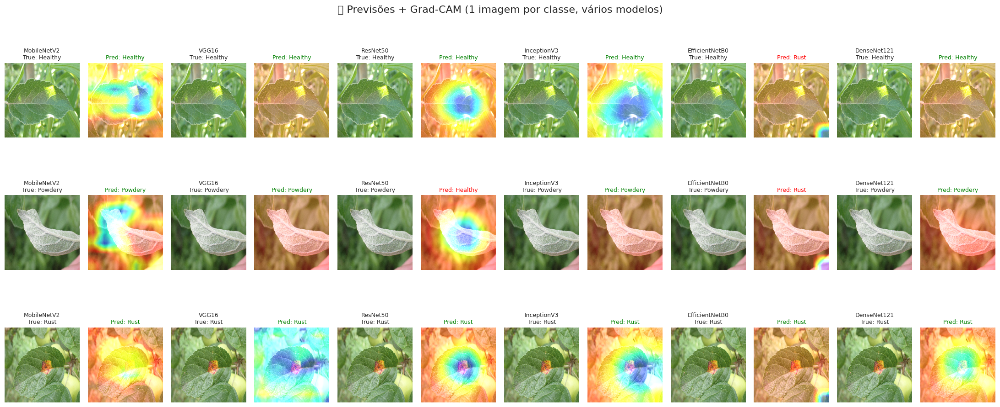

In [17]:
import os
import matplotlib.pyplot as plt
import cv2
import numpy as np
from tensorflow.keras.models import Model
from tensorflow.keras.preprocessing import image

# Caminhos das imagens de cada classe
image_paths = {
    "Healthy": "/kaggle/input/plant-disease-recognition-dataset/Validation/Validation/Healthy/9bf9cca507923334.jpg",
    "Powdery": "/kaggle/input/plant-disease-recognition-dataset/Validation/Validation/Powdery/8fd27998ae52a4a6.jpg",
    "Rust": "/kaggle/input/plant-disease-recognition-dataset/Validation/Validation/Rust/8152cfbd5a28b5d2.jpg"
}

# Carregar imagem e preprocessar
def load_and_preprocess_image(img_path, target_size=(224, 224)):
    img = image.load_img(img_path, target_size=target_size)
    img_array = image.img_to_array(img) / 255.0
    return img, np.expand_dims(img_array, axis=0)

# Função Grad-CAM
def get_gradcam_heatmap(model, img_array, class_index, layer_name):
    grad_model = Model([model.inputs], [model.get_layer(layer_name).output, model.output])
    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        loss = predictions[:, class_index]
    grads = tape.gradient(loss, conv_outputs)[0]
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))
    conv_outputs = conv_outputs[0]
    heatmap = tf.reduce_sum(tf.multiply(pooled_grads, conv_outputs), axis=-1)
    heatmap = np.maximum(heatmap, 0)
    heatmap /= (np.max(heatmap) + 1e-6)
    return heatmap

# Função para sobrepor Grad-CAM
def overlay_gradcam(img, heatmap, alpha=0.6, colormap=cv2.COLORMAP_JET):
    heatmap = cv2.resize(heatmap, (img.size[0], img.size[1]))
    heatmap_color = cv2.applyColorMap(np.uint8(255 * heatmap), colormap)
    superimposed_img = heatmap_color * alpha + np.array(img)
    superimposed_img = np.clip(superimposed_img, 0, 255).astype(np.uint8)
    return superimposed_img

# Plot
fig, axes = plt.subplots(len(image_paths), len(trained_models)*2, figsize=(22, 10))

class_names = ["Healthy", "Powdery", "Rust"]
class_indices = {name: i for i, name in enumerate(class_names)}

for row_idx, (true_class, img_path) in enumerate(image_paths.items()):
    original_img, img_array = load_and_preprocess_image(img_path)

    for col_idx, result in enumerate(trained_models):
        model = result["model"]
        model_name = result["name"]
        layer_name = result["layer"]

        # Predição
        pred_probs = model.predict(img_array)
        pred_class_idx = np.argmax(pred_probs)
        pred_class = class_names[pred_class_idx]

        # Grad-CAM
        heatmap = get_gradcam_heatmap(model, img_array, pred_class_idx, layer_name)
        gradcam_img = overlay_gradcam(original_img, heatmap)

        # Original
        axes[row_idx, col_idx*2].imshow(original_img)
        axes[row_idx, col_idx*2].set_title(f"{model_name}\nTrue: {true_class}", fontsize=9)
        axes[row_idx, col_idx*2].axis("off")

        # Grad-CAM
        axes[row_idx, col_idx*2 + 1].imshow(gradcam_img)
        axes[row_idx, col_idx*2 + 1].set_title(f"Pred: {pred_class}",
                                               color="green" if pred_class == true_class else "red",
                                               fontsize=9)
        axes[row_idx, col_idx*2 + 1].axis("off")

plt.suptitle("📊 Previsões + Grad-CAM (1 imagem por classe, vários modelos)", fontsize=16)
plt.tight_layout()
plt.show()


In [18]:
import matplotlib.pyplot as plt
import numpy as np
import tensorflow as tf
from tensorflow.keras.models import load_model
from PIL import Image
import os
import pandas as pd

# List of validation image paths organized by class
image_paths = {
    "Healthy": [
        "/kaggle/input/plant-disease-recognition-dataset/Validation/Validation/Healthy/9bd4cc8c52e9d52a.jpg",
        "/kaggle/input/plant-disease-recognition-dataset/Validation/Validation/Healthy/9bdcc23296db1516.jpg",
        "/kaggle/input/plant-disease-recognition-dataset/Validation/Validation/Healthy/9be41b823d13e3c6.jpg",
        "/kaggle/input/plant-disease-recognition-dataset/Validation/Validation/Healthy/9be561de7c792420.jpg",
        "/kaggle/input/plant-disease-recognition-dataset/Validation/Validation/Healthy/9bf9cca507923334.jpg"
    ],
    "Powdery": [
        "/kaggle/input/plant-disease-recognition-dataset/Validation/Validation/Powdery/8f6737815b2cd234.jpg",
        "/kaggle/input/plant-disease-recognition-dataset/Validation/Validation/Powdery/8fba25d912583ba6.jpg",
        "/kaggle/input/plant-disease-recognition-dataset/Validation/Validation/Powdery/8fc5721dc2f293c1.jpg",
        "/kaggle/input/plant-disease-recognition-dataset/Validation/Validation/Powdery/8fd27998ae52a4a6.jpg",
        "/kaggle/input/plant-disease-recognition-dataset/Validation/Validation/Powdery/9a962f656993095b.jpg"
    ],
    "Rust": [
        "/kaggle/input/plant-disease-recognition-dataset/Validation/Validation/Rust/8030a3a79fca6abb.jpg",
        "/kaggle/input/plant-disease-recognition-dataset/Validation/Validation/Rust/8152cfbd5a28b5d2.jpg",
        "/kaggle/input/plant-disease-recognition-dataset/Validation/Validation/Rust/8196e2d8b66ed721.jpg",
        "/kaggle/input/plant-disease-recognition-dataset/Validation/Validation/Rust/8219aa662e8fd59d.jpg",
        "/kaggle/input/plant-disease-recognition-dataset/Validation/Validation/Rust/8437f01fd3d20f26.jpg"
    ]
}

# Function to load and preprocess images for prediction
def load_and_preprocess_image(path, target_size=(224, 224)):
    img = Image.open(path).convert('RGB')
    img = img.resize(target_size)
    img_array = np.array(img) / 255.0  # Normalize to [0, 1]
    return img_array

# Load trained models (MobileNetV2 and VGG16)
mobilenet_model = trained_models[0]["model"]
vgg16_model = trained_models[1]["model"]
model_names = ["MobileNetV2", "VGG16"]
models = [mobilenet_model, vgg16_model]

# Perform predictions on all selected images
predictions = []

for model, name in zip(models, model_names):
    for label, paths in image_paths.items():
        for path in paths:
            img_array = load_and_preprocess_image(path)
            input_tensor = np.expand_dims(img_array, axis=0)
            pred = model.predict(input_tensor, verbose=0)
            pred_label = np.argmax(pred)
            predictions.append({
                "model": name,
                "true": label,
                "pred": pred_label
            })

# Create a DataFrame with the prediction results
df_preds = pd.DataFrame(predictions)
df_preds

,model,true,pred
0,MobileNetV2,Healthy,0
1,MobileNetV2,Healthy,0
2,MobileNetV2,Healthy,0
3,MobileNetV2,Healthy,0
4,MobileNetV2,Healthy,0
5,MobileNetV2,Powdery,1
6,MobileNetV2,Powdery,1
7,MobileNetV2,Powdery,1
8,MobileNetV2,Powdery,1
9,MobileNetV2,Powdery,1


In [19]:
# Export the prediction results to a CSV file
df_preds.to_csv("results.csv", index=False)

# Part 9 - Neural Networks Results

In [20]:
# Create a summary DataFrame from training histories
summary_data = []

for result in trained_models:
    name = result['name']
    history = result['history'].history
    
    val_acc = history['val_accuracy']
    val_loss = history['val_loss']
    train_acc = history['accuracy']
    train_loss = history['loss']
    
    summary_data.append({"Model": name,
                         "Epochs Trained": len(val_acc),
                         "Final Val Accuracy": val_acc[-1],
                         "Best Val Accuracy": max(val_acc),
                         "Final Val Loss": val_loss[-1],
                         "Min Val Loss": min(val_loss),
                         "Final Train Accuracy": train_acc[-1],
                         "Final Train Loss": train_loss[-1]})

# Create DataFrame
df_summary = pd.DataFrame(summary_data)
df_summary = df_summary.sort_values(by="Best Val Accuracy", ascending=False).reset_index(drop=True)

# Export the models results to a CSV file
df_summary.to_csv("model_training_summary.csv", index=False)

# Display summary
df_summary

,Model,Epochs Trained,Final Val Accuracy,Best Val Accuracy,Final Val Loss,Min Val Loss,Final Train Accuracy,Final Train Loss
0,DenseNet121,42,0.983333,1.000000,0.025834,0.023539,0.978064,0.082682
1,InceptionV3,31,1.000000,1.000000,0.030654,0.023224,0.947806,0.145861
2,MobileNetV2,22,0.966667,0.983333,0.094848,0.077246,0.975038,0.083471
3,VGG16,92,0.916667,0.933333,0.219773,0.217914,0.906959,0.291530
4,ResNet50,49,0.616667,0.633333,1.016822,1.016704,0.453858,1.058616
5,EfficientNetB0,13,0.333333,0.400000,1.098433,1.097994,0.320726,1.102291


# Part 10 - Deploy with model train

**Model 1 - CNN VGG16**

In [21]:
# Load the saved model
model = tf.keras.models.load_model('/kaggle/working/VGG16_model.keras') 

In [22]:
# Define class names
class_names = ['Healthy', 'Powdery', 'Rust']


In [23]:
# Define image paths (5 per class)
image_paths = [
    
    # Healthy class
    '/kaggle/input/plant-disease-recognition-dataset/Validation/Validation/Healthy/9bd4cc8c52e9d52a.jpg',
    '/kaggle/input/plant-disease-recognition-dataset/Validation/Validation/Healthy/9bdcc23296db1516.jpg',
    '/kaggle/input/plant-disease-recognition-dataset/Validation/Validation/Healthy/9be41b823d13e3c6.jpg',
    '/kaggle/input/plant-disease-recognition-dataset/Validation/Validation/Healthy/9be561de7c792420.jpg',
    '/kaggle/input/plant-disease-recognition-dataset/Validation/Validation/Healthy/9bf9cca507923334.jpg',

    # Powdery class
    '/kaggle/input/plant-disease-recognition-dataset/Validation/Validation/Powdery/8f6737815b2cd234.jpg',
    '/kaggle/input/plant-disease-recognition-dataset/Validation/Validation/Powdery/8fba25d912583ba6.jpg',
    '/kaggle/input/plant-disease-recognition-dataset/Validation/Validation/Powdery/8fc5721dc2f293c1.jpg',
    '/kaggle/input/plant-disease-recognition-dataset/Validation/Validation/Powdery/8fd27998ae52a4a6.jpg',
    '/kaggle/input/plant-disease-recognition-dataset/Validation/Validation/Powdery/9a962f656993095b.jpg',

    # Rust class
    '/kaggle/input/plant-disease-recognition-dataset/Validation/Validation/Rust/8030a3a79fca6abb.jpg',
    '/kaggle/input/plant-disease-recognition-dataset/Validation/Validation/Rust/8152cfbd5a28b5d2.jpg',
    '/kaggle/input/plant-disease-recognition-dataset/Validation/Validation/Rust/8196e2d8b66ed721.jpg',
    '/kaggle/input/plant-disease-recognition-dataset/Validation/Validation/Rust/8219aa662e8fd59d.jpg',
    '/kaggle/input/plant-disease-recognition-dataset/Validation/Validation/Rust/8437f01fd3d20f26.jpg'
]

In [24]:
# Function to predict and display the image with model label
def predict_and_plot(image_path, true_label, model_name="VGG16"):
    # Open and resize the image
    img = Image.open(image_path).resize((224, 224))
    img_array = np.array(img) / 255.0
    input_img = np.expand_dims(img_array, axis=0)

    # Make prediction
    prediction = model.predict(input_img, verbose=0)
    pred_label = class_names[np.argmax(prediction)]

    # Display result
    plt.figure(figsize=(4, 4))
    plt.imshow(img)
    plt.axis('off')
    plt.title(f'True: {true_label}\nPred: {pred_label}', fontsize=12,
              backgroundcolor='black', color='white')
    plt.figtext(0.5, 0.01, f'Model: {model_name}', ha='center', fontsize=10, color='gray')
    plt.tight_layout()
    plt.show() 

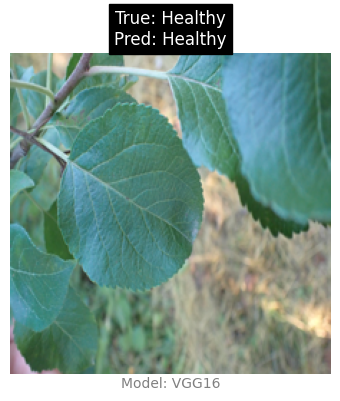

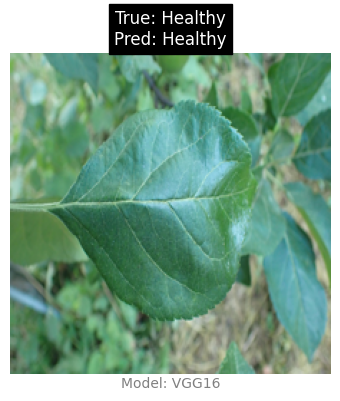

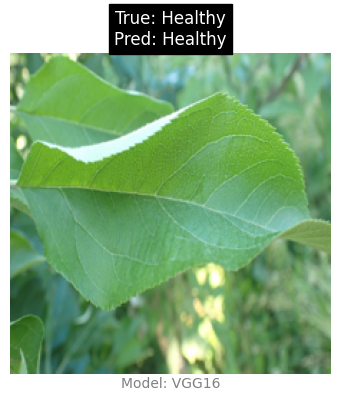

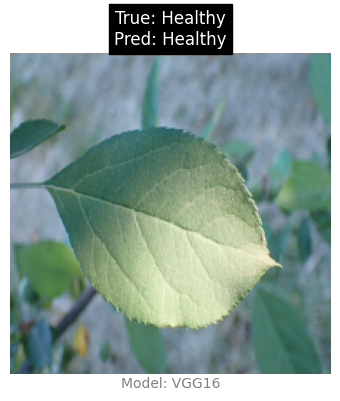

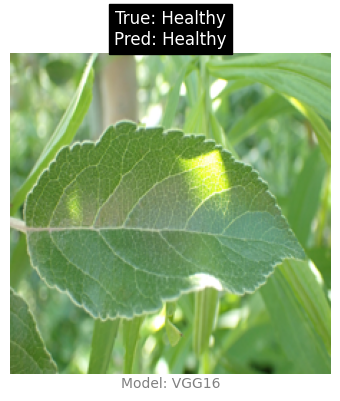

...

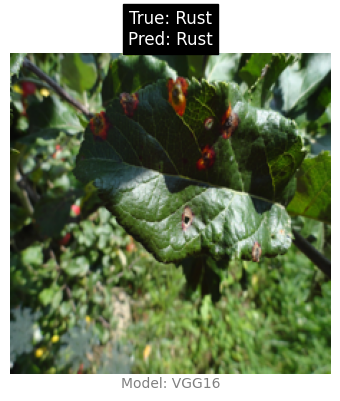

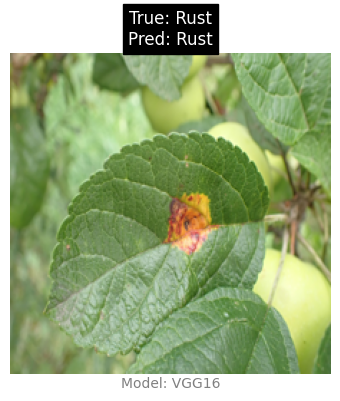

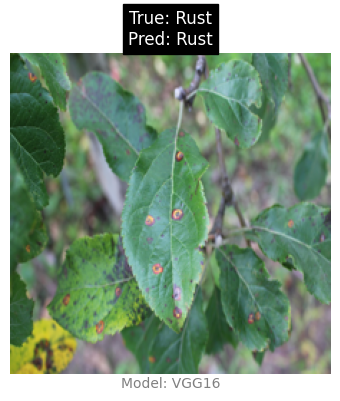

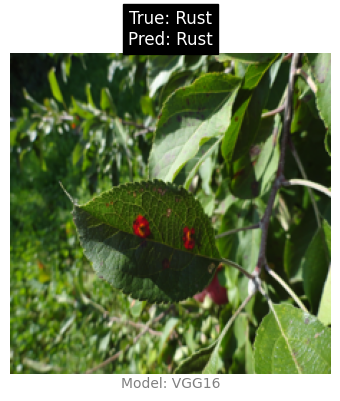

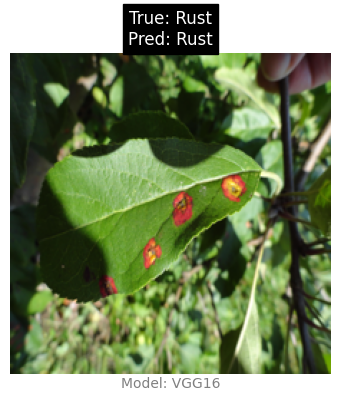

In [25]:
# Loop to predict and display all images
for path in image_paths:
    true_label = path.split('/')[-2]  # Extracts "Healthy", "Powdery", etc. from folder name
    predict_and_plot(path, true_label)

**Model 2 - CNN MobileNetV2**

In [26]:
# Load the saved MobileNetV2 model
model = tf.keras.models.load_model('/kaggle/working/MobileNetV2_model.keras')

In [27]:
# Define class names
class_names = ['Healthy', 'Powdery', 'Rust']

In [28]:
# Define image paths (5 per class)
image_paths = [
    # Healthy class
    '/kaggle/input/plant-disease-recognition-dataset/Validation/Validation/Healthy/9bd4cc8c52e9d52a.jpg',
    '/kaggle/input/plant-disease-recognition-dataset/Validation/Validation/Healthy/9bdcc23296db1516.jpg',
    '/kaggle/input/plant-disease-recognition-dataset/Validation/Validation/Healthy/9be41b823d13e3c6.jpg',
    '/kaggle/input/plant-disease-recognition-dataset/Validation/Validation/Healthy/9be561de7c792420.jpg',
    '/kaggle/input/plant-disease-recognition-dataset/Validation/Validation/Healthy/9bf9cca507923334.jpg',

    # Powdery class
    '/kaggle/input/plant-disease-recognition-dataset/Validation/Validation/Powdery/8f6737815b2cd234.jpg',
    '/kaggle/input/plant-disease-recognition-dataset/Validation/Validation/Powdery/8fba25d912583ba6.jpg',
    '/kaggle/input/plant-disease-recognition-dataset/Validation/Validation/Powdery/8fc5721dc2f293c1.jpg',
    '/kaggle/input/plant-disease-recognition-dataset/Validation/Validation/Powdery/8fd27998ae52a4a6.jpg',
    '/kaggle/input/plant-disease-recognition-dataset/Validation/Validation/Powdery/9a962f656993095b.jpg',

    # Rust class
    '/kaggle/input/plant-disease-recognition-dataset/Validation/Validation/Rust/8030a3a79fca6abb.jpg',
    '/kaggle/input/plant-disease-recognition-dataset/Validation/Validation/Rust/8152cfbd5a28b5d2.jpg',
    '/kaggle/input/plant-disease-recognition-dataset/Validation/Validation/Rust/8196e2d8b66ed721.jpg',
    '/kaggle/input/plant-disease-recognition-dataset/Validation/Validation/Rust/8219aa662e8fd59d.jpg',
    '/kaggle/input/plant-disease-recognition-dataset/Validation/Validation/Rust/8437f01fd3d20f26.jpg'
]

# Function to predict and display the image with model prediction
def predict_and_plot(image_path, true_label, model_name="MobileNetV2"):
    # Open and resize the image
    img = Image.open(image_path).resize((224, 224))
    img_array = np.array(img) / 255.0
    input_img = np.expand_dims(img_array, axis=0)

    # Make prediction
    prediction = model.predict(input_img, verbose=0)
    pred_label = class_names[np.argmax(prediction)]

    # Display prediction result
    plt.figure(figsize=(4, 4))
    plt.imshow(img)
    plt.axis('off')
    plt.title(f'True: {true_label}\nPred: {pred_label}', fontsize=12,
              backgroundcolor='black', color='white')
    plt.figtext(0.5, 0.01, f'Model: {model_name}', ha='center', fontsize=10, color='gray')
    plt.tight_layout()
    plt.show() 

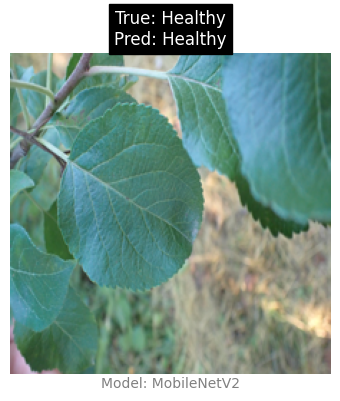

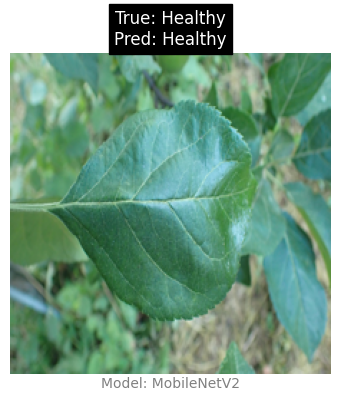

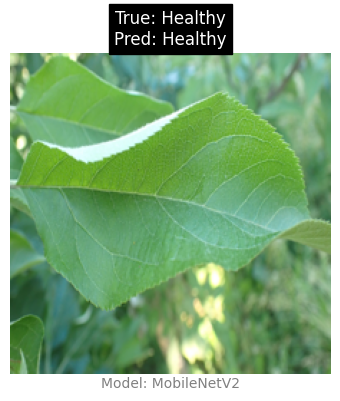

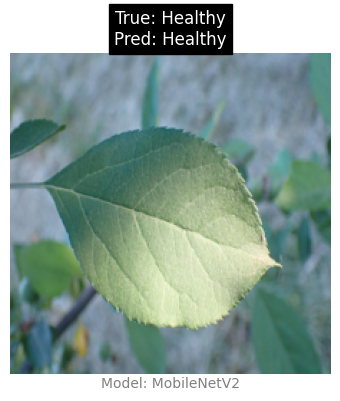

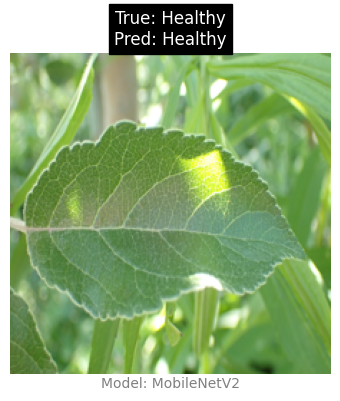

...

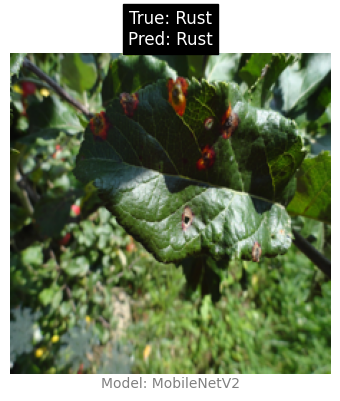

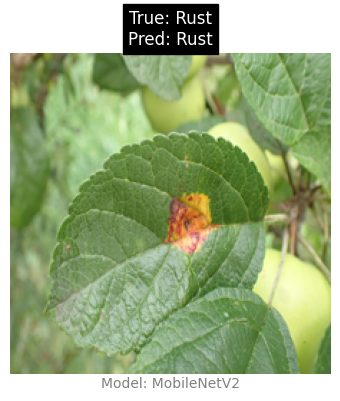

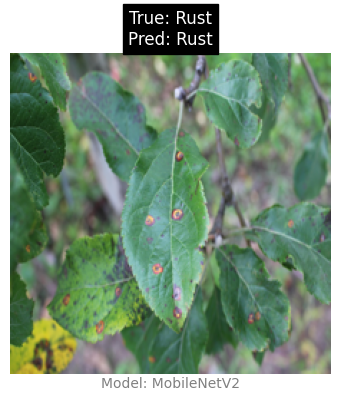

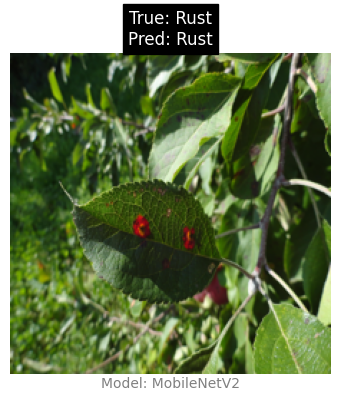

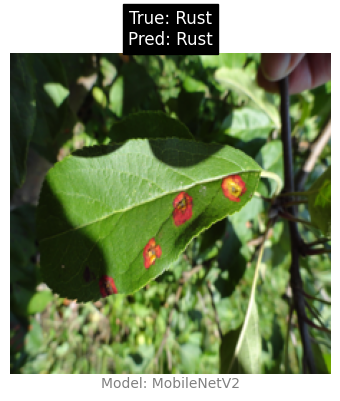

In [29]:
# Loop to predict and display all images
for path in image_paths:
    true_label = path.split('/')[-2]  # Extracts "Healthy", "Powdery", etc. from folder name
    predict_and_plot(path, true_label)